In [1]:
import numpy as np 
import pandas as pd 
import pandas_profiling
import pandas_summary as ps

# Data processing, metrics and modeling
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn.decomposition import PCA
import collections

# Lgbm
import lightgbm as lgb

# Hyper_opt
from hyperopt import hp
from hyperopt import fmin, tpe, Trials, space_eval, STATUS_OK, STATUS_RUNNING
import hyperopt.pyll
from hyperopt.pyll import scope

# Suppr warning
import warnings
warnings.filterwarnings("ignore")

# Plots
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import rcParams

# Others
import shap
import datetime
from tqdm import tqdm_notebook
import sys
import pickle
import re
import json

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)
pd.set_option('use_inf_as_na', True)

warnings.simplefilter('ignore')
matplotlib.rcParams['figure.dpi'] = 100
sns.set()
%matplotlib inline

Сразу же, сделаем правильные вещи. Уменьшим объем памяти под датафрейм при чтении.

In [2]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [3]:
train_df = reduce_mem_usage(pd.read_csv('Train_df.csv'))
test_df = reduce_mem_usage(pd.read_csv('Test_df.csv'))

Memory usage of dataframe is 170.69 MB
Memory usage after optimization is: 31.23 MB
Decreased by 81.7%
Memory usage of dataframe is 18.82 MB
Memory usage after optimization is: 3.45 MB
Decreased by 81.7%


Хорошая оптимизация ;)

## EDA

In [4]:
train_df.shape, test_df.shape

((169486, 132), (18832, 131))

# С таким объемом можно использовать градиентный бустинг!

In [5]:
train_df.head()

,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130,target
0,NCT2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330566,0.737305,0.592773,0.614258,0.885742,0.438965,0.436523,0.601074,0.351318,0.439209,0.338379,0.366211,0.611328,0.304443,1283.599976
1,NCT5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261963,0.358398,0.484131,0.236938,0.396973,0.289551,0.315430,0.273193,0.260742,0.324463,0.381348,0.373535,0.195679,0.774414,3005.090088
2,NCT10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321533,0.555664,0.527832,0.373779,0.422363,0.440918,0.391113,0.317871,0.321289,0.444580,0.327881,0.321533,0.604980,0.602539,939.849976
3,NCT11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273193,0.160034,0.527832,0.473145,0.704102,0.178223,0.247437,0.245605,0.220947,0.212280,0.204712,0.202271,0.245972,0.432617,2763.850098
4,NCT13,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,J,D,A,A,E,E,H,F,B,BI,CS,A,AS,AE,A,K,DJ,0.546875,0.681641,0.634277,0.373779,0.302734,0.364502,0.401123,0.268555,0.462158,0.505371,0.366699,0.359131,0.345215,0.726562,5142.870117


In [6]:
train_df.tail()

,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130,target
169481,NCT587620,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,A,D,B,C,B,D,B,B,C,B,B,B,A,A,A,A,A,D,D,D,E,E,A,P,I,D,A,A,D,E,J,G,B,BI,EG,A,G,BM,A,L,CK,0.347412,0.785645,0.613770,0.473145,0.939453,0.242432,0.290039,0.245605,0.308594,0.329346,0.223022,0.219971,0.333252,0.208252,1198.619995
169482,NCT587624,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,A,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,K,A,A,A,E,E,H,F,B,BI,BT,A,AV,AU,E,J,DF,0.507812,0.555664,0.549805,0.802734,0.704102,0.334229,0.382080,0.634766,0.404541,0.477783,0.307617,0.302002,0.318604,0.305908,1108.339966
169483,NCT587630,A,B,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,D,B,D,B,C,B,A,C,B,B,B,A,A,A,B,H,D,D,D,E,C,A,P,F,C,C,A,E,F,H,F,B,BI,DM,A,W,AF,A,K,DJ,0.484375,0.785645,0.792480,0.189087,0.482422,0.345947,0.370605,0.245605,0.458008,0.477783,0.445557,0.443359,0.339355,0.503906,5762.640137
169484,NCT587632,A,B,A,A,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,A,D,D,A,B,C,B,D,B,A,A,A,A,A,C,D,C,E,C,D,T,L,J,A,A,K,G,F,J,K,BI,AI,A,AS,AJ,A,O,MD,0.438477,0.422119,0.299072,0.383545,0.340576,0.704590,0.562988,0.349854,0.447754,0.538574,0.863281,0.853027,0.654785,0.721680,1562.869995
169485,NCT587633,B,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,B,D,D,B,B,C,B,D,B,A,A,A,E,B,D,D,C,E,A,C,T,I,A,A,A,L,H,F,G,G,BI,EG,K,AS,AD,A,O,MJ,0.907227,0.620605,0.440674,0.821777,0.281250,0.844727,0.533203,0.971191,0.933594,0.838379,0.932129,0.946289,0.810547,0.721680,4751.720215


In [7]:
test_df.head()

,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130
0,NCT1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726074,0.245972,0.187622,0.789551,0.310059,0.718262,0.334961,0.302490,0.671387,0.834961,0.569824,0.594727,0.822266,0.714844
1,NCT25,A,B,A,A,A,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,A,B,B,B,A,A,A,G,H,D,D,D,E,A,A,P,H,Q,A,A,F,G,G,F,D,BI,AM,A,AS,H,A,K,GS,0.496094,0.358398,0.654297,0.283936,0.281250,0.429443,0.877930,0.394531,0.535645,0.505371,0.550293,0.538574,0.336182,0.714844
2,NCT57,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,F,AE,A,O,DJ,0.338379,0.785645,0.654297,0.373779,0.718750,0.441406,0.437256,0.317871,0.321289,0.444580,0.377686,0.369873,0.604980,0.743652
3,NCT100,B,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,B,B,D,B,B,C,B,D,D,A,A,A,A,A,D,D,C,E,C,D,T,J,C,A,A,G,F,G,J,K,BI,CO,A,N,AX,A,N,HK,0.452637,0.488770,0.549805,0.432617,0.281250,0.577148,0.582520,0.656738,0.483154,0.577148,0.625977,0.612793,0.617676,0.598633
4,NCT140,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,A,E,C,A,F,I,A,A,A,F,E,E,F,A,BI,W,A,I,F,E,J,GS,0.347412,0.422119,0.613770,0.383545,0.372314,0.590332,0.864258,0.524414,0.347412,0.334229,0.531250,0.519531,0.253418,0.295166


In [8]:
test_df.tail()

,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130
18827,NCT587514,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,B,A,D,B,D,B,B,B,C,A,B,B,C,A,A,A,C,A,D,B,D,E,C,A,P,G,A,A,A,F,G,H,F,B,N,CV,G,E,BM,A,J,GS,0.465576,0.078369,0.484131,0.383545,0.281250,0.300293,0.331299,0.360840,0.360840,0.364502,0.430176,0.443359,0.269043,0.823242
18828,NCT587541,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,B,A,A,A,D,D,D,E,A,A,P,K,A,A,A,F,F,G,F,B,BI,CO,A,E,X,E,K,GC,0.638672,0.555664,0.549805,0.833008,0.836426,0.482422,0.429688,0.672852,0.519043,0.604004,0.464844,0.481201,0.407715,0.801758
18829,NCT587566,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,B,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,A,D,B,B,D,D,B,B,C,B,C,B,A,A,A,A,A,D,D,E,E,G,E,R,O,A,A,A,G,F,F,I,F,BI,CO,K,U,AE,A,N,HK,0.642578,0.488770,0.549805,0.327393,0.422363,0.688477,0.490479,0.339111,0.625488,0.730957,0.622070,0.609375,0.687012,0.342041
18830,NCT587580,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,B,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,B,A,A,B,D,B,B,D,D,B,B,A,B,D,B,A,A,A,G,H,D,D,C,E,A,D,T,I,A,A,A,G,F,E,J,K,BI,CL,I,E,BN,A,N,HQ,0.447021,0.620605,0.710938,0.422607,0.850098,0.835938,0.794434,0.530273,0.508301,0.675781,0.742676,0.729980,0.663574,0.804688
18831,NCT587611,A,B,A,A,B,A,A,A,B,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,B,D,E,E,A,P,G,F,A,B,C,E,K,H,B,K,EB,A,J,AE,A,L,CI,0.289551,0.358398,0.506348,0.354980,0.302734,0.186279,0.317383,0.278076,0.321289,0.243530,0.180420,0.178711,0.304443,0.381592


Используя pandas_summary посмотрим describe по колонкам. Кстати, тут сразу можно посмотреть, корректно ли отработал reduce_mem_usage, в некоторых случаях он дает inf... Если что-то пошло не так, то inf-ы появятся в min и max.

In [9]:
dfs = ps.DataFrameSummary(train_df)
print('categoricals: ', dfs.categoricals.tolist())
print('numerics: ', dfs.numerics.tolist())
dfs.summary()

categoricals:  ['col_73', 'col_74', 'col_75', 'col_76', 'col_77', 'col_78', 'col_79', 'col_80', 'col_81', 'col_82', 'col_83', 'col_84', 'col_85', 'col_86', 'col_87', 'col_88', 'col_89', 'col_90', 'col_91', 'col_92', 'col_93', 'col_94', 'col_95', 'col_96', 'col_97', 'col_98', 'col_99', 'col_100', 'col_101', 'col_102', 'col_103', 'col_104', 'col_105', 'col_106', 'col_107', 'col_108', 'col_109', 'col_110', 'col_111', 'col_112', 'col_113', 'col_114', 'col_115', 'col_116']
numerics:  ['col_117', 'col_118', 'col_119', 'col_120', 'col_121', 'col_122', 'col_123', 'col_124', 'col_125', 'col_126', 'col_127', 'col_128', 'col_129', 'col_130', 'target']


,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130,target
count,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486,169486
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3044.01
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2917.98
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5974e-05,0.00114918,0.00263405,0.17688,0.28125,0.0126801,0.069519,0.236938,7.99894e-05,0,0.0353088,0.0362244,0.000228047,0.179688,0.67
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.346191,0.358398,0.336914,0.327393,0.28125,0.336182,0.350098,0.312744,0.358887,0.364502,0.311035,0.314941,0.315674,0.294678,1204.4
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [10]:
dfs = ps.DataFrameSummary(test_df)
print('categoricals: ', dfs.categoricals.tolist())
print('numerics: ', dfs.numerics.tolist())
dfs.summary()

categoricals:  ['col_73', 'col_74', 'col_76', 'col_77', 'col_78', 'col_79', 'col_80', 'col_81', 'col_82', 'col_83', 'col_84', 'col_85', 'col_86', 'col_87', 'col_88', 'col_89', 'col_90', 'col_91', 'col_92', 'col_93', 'col_94', 'col_95', 'col_96', 'col_97', 'col_98', 'col_99', 'col_100', 'col_101', 'col_102', 'col_103', 'col_104', 'col_105', 'col_106', 'col_107', 'col_108', 'col_109', 'col_110', 'col_111', 'col_112', 'col_113', 'col_114', 'col_115', 'col_116']
numerics:  ['col_117', 'col_118', 'col_119', 'col_120', 'col_121', 'col_122', 'col_123', 'col_124', 'col_125', 'col_126', 'col_127', 'col_128', 'col_129', 'col_130']


,id,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,col_10,col_11,col_12,col_13,col_14,col_15,col_16,col_17,col_18,col_19,col_20,col_21,col_22,col_23,col_24,col_25,col_26,col_27,col_28,col_29,col_30,col_31,col_32,col_33,col_34,col_35,col_36,col_37,col_38,col_39,col_40,col_41,col_42,col_43,col_44,col_45,col_46,col_47,col_48,col_49,col_50,col_51,col_52,col_53,col_54,col_55,col_56,col_57,col_58,col_59,col_60,col_61,col_62,col_63,col_64,col_65,col_66,col_67,col_68,col_69,col_70,col_71,col_72,col_73,col_74,col_75,col_76,col_77,col_78,col_79,col_80,col_81,col_82,col_83,col_84,col_85,col_86,col_87,col_88,col_89,col_90,col_91,col_92,col_93,col_94,col_95,col_96,col_97,col_98,col_99,col_100,col_101,col_102,col_103,col_104,col_105,col_106,col_107,col_108,col_109,col_110,col_111,col_112,col_113,col_114,col_115,col_116,col_117,col_118,col_119,col_120,col_121,col_122,col_123,col_124,col_125,col_126,col_127,col_128,col_129,col_130
count,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18832,18832,18832,18832,18832,18832,18832,18832,18832,18832,18832,18832,18832,18832
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.493652,0.504883,0.499268,0.489746,0.485596,0.491943,0.485596,0.486328,0.485596,0.498779,0.493164,0.492676,0.494385,0.494385
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.187622,0.207397,0.20105,0.210571,0.208496,0.205933,0.17749,0.199829,0.181641,0.186279,0.209473,0.209351,0.213135,0.222656
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5974e-05,0.00257111,0.00263405,0.17688,0.28125,0.0126801,0.069519,0.236938,7.99894e-05,0,0.0353088,0.0362244,0.000228047,0.180542
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.347412,0.358398,0.336914,0.327393,0.28125,0.336182,0.351562,0.312744,0.358887,0.364502,0.307617,0.30835,0.315674,0.294434
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

# Target:

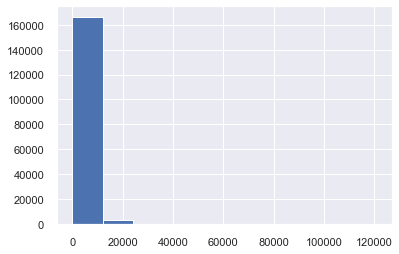

In [11]:
train_df['target'].hist();

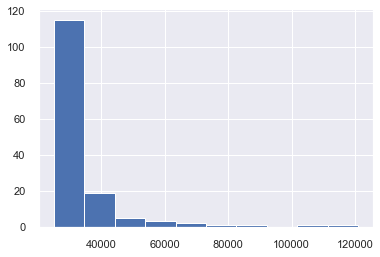

In [12]:
train_df[train_df['target']>25000]['target'].hist();

### Распределение не очень... Прологорифмируем!

In [13]:
train_df['target'] = np.log1p(train_df['target'])

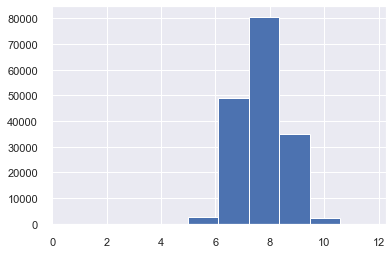

In [14]:
train_df['target'].hist();

In [15]:
y = train_df['target']
train_df.drop('target', axis=1, inplace=True)

## Гораздо лучше!

В колонке id вряд ли зашит какой-то инсайд, дропнем. Правильней, конечно, индексировать датафрейм по id, но пайплайна задачи нет выстроить, поэтому опустим этот момент)

In [16]:
train_df.drop('id', axis=1, inplace=True)
test_df.drop('id', axis=1, inplace=True)

##### Проверим колонки в тесте и трейне

In [17]:
train_df.columns.tolist() == test_df.columns.tolist()

True

## Посмотрим на распределения, корреляции, и другие характеристики выборок.

штука тяжелая, но у меня хороший пк, для сорвенований собирал)

In [18]:
pandas_profiling.ProfileReport(train_df)

In [19]:
pandas_profiling.ProfileReport(test_df)

## Feature инжиниринга делать не буду. Гипотеза - количество фичей избыточно. Будем искать топ фичи и исключать влияющие отрицательно на качество.

In [20]:
cat = train_df.select_dtypes(include=['category']).columns.tolist()

In [21]:
X_train, X_val, y_train, y_val = train_test_split(train_df, y, test_size=0.25, random_state=777)

# Воспользуемся более современными методами. Гиперпараметры будем выбирать гиероптом, а не гридсерчем. 

In [35]:
%%time
# Чем больше P, тем меньше мы хотим штрафовать за разницу между train  и test
p = 0.8
# k - количество итераций
k = 30

skf = KFold(n_splits=3, shuffle=True, random_state=7)

def score(params):
    print('Training with params:')
    print(params)
    w=[]
    best_iter = []
    

    for train_index, val_index in skf.split(X_train, y_train):
        x_train_1, x_valid_1 = X_train.iloc[train_index, :], X_train.iloc[val_index, :]
        y_train_1, y_valid_1 = y_train.iloc[train_index], y_train.iloc[val_index]
        train_data = lgb.Dataset(x_train_1, label=y_train_1, categorical_feature=cat)
        val_data = lgb.Dataset(x_valid_1, label=y_valid_1, categorical_feature=cat, reference=train_data)
        gbm = lgb.train(params,
                        train_data,
                        valid_sets = [train_data, val_data],
                        valid_names=['train', 'val'],
                        num_boost_round = 5000,
                        verbose_eval = False, 
                        categorical_feature=cat
                       )
        w.append([gbm.best_score['train']['rmse'], gbm.best_score['val']['rmse']])
        best_iter.append(gbm.best_iteration)
    nrounds = np.mean(best_iter)
    print('best iter:', int(nrounds), 'all iter:', best_iter)
    res = list(np.mean(w, axis=0))
    print("\t rmse train {0}, rmse test {1}, dif {2}, \n\t final score {3} \n\n".format(res[0], res[1], np.power(np.square(res[0]-res[1]), p), +res[1]+np.power(np.square(res[0]-res[1]), p)))
    return {'loss': +res[1]+np.power(np.square(res[0]-res[1]), p), 'status': STATUS_OK, 
            'mean_rmse_train': res[0], 'mean_rmse_test': res[1], 'best_iter': int(nrounds)}

def optimize(trials):
    space = {
        #'max_depth': hp.choice('max_depth', [-1, 6, 7]),
        'max_depth': -1,
        'max_bin': scope.int(hp.uniform('max_bin', 100, 2500)),
        'num_leaves': scope.int(hp.uniform('num_leaves', 20, 200)),
        'lambda_l1': hp.quniform('lambda_l1', 0, 8, 0.25),
        'learning_rate': hp.quniform('learning_rate', 0.01 , 0.05, 0.005),
        'bagging_fraction': hp.quniform('bagging_fraction', 0.3, 0.9, 0.1),
        'metric': ('rmse',),
        'boosting_type': 'gbdt',
        'objective': 'regression',
        'nthread': 8,
        'early_stopping_rounds': 20,
        'silent':1,
    }
    best = fmin(score, space, algo=tpe.suggest, trials=trials, max_evals=k)
    print(best)

trials = Trials()
optimize(trials)

Training with params:                                                          
{'bagging_fraction': 0.6000000000000001, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 4.25, 'learning_rate': 0.045, 'max_bin': 2077, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 132, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
211                                                                            
all iter:                                                                      
[219, 209, 206]                                                                
	 rmse train 0.45892778753738744, rmse test 0.5446991087693996, dif 0.019649312519173616, 
	 final score 0.5643484212885732 


Training with params:                                                          
{'bagging_fraction': 0.8, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 3.0, 'learning_rate': 0.045, 'max_

best iter:                                                                     
1053                                                                           
all iter:                                                                      
[987, 1086, 1086]                                                              
	 rmse train 0.49760658822918397, rmse test 0.5427190215985951, dif 0.007028683794795571, 
	 final score 0.5497477053933907 


Training with params:                                                          
{'bagging_fraction': 0.30000000000000004, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 8.0, 'learning_rate': 0.035, 'max_bin': 2257, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 36, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
430                                                                            
all iter:                                       

	 rmse train 0.5112327594630935, rmse test 0.543189602854492, dif 0.004048575092817098, 
	 final score 0.5472381779473091 


Training with params:                                                          
{'bagging_fraction': 0.7000000000000001, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 6.5, 'learning_rate': 0.025, 'max_bin': 421, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 90, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
431                                                                            
all iter:                                                                      
[375, 460, 460]                                                                
	 rmse train 0.4739851900775731, rmse test 0.543793883351483, dif 0.014133678685784322, 
	 final score 0.5579275620372673 


Training with params:                                                          
{'baggi

# Обучим модель с подобранными гиперпараметрами.

In [31]:
params = trials.best_trial['misc']['vals']
params['max_depth'] = -1
params['boosting_type'] = 'gbdt'
params['objective'] = 'regression'
params['metric'] = ('l1', 'l2')
params['nthread'] = 8
params['early_stopping_rounds'] = 100
params['silent'] = 1
params['num_leaves'] = int(params['num_leaves'][0])
params['max_bin'] = int(params['max_bin'][0])
params

{'bagging_fraction': [0.7000000000000001],
 'lambda_l1': [1.25],
 'learning_rate': [0.035],
 'max_bin': 1454,
 'num_leaves': 44,
 'max_depth': -1,
 'boosting_type': 'gbdt',
 'objective': 'regression',
 'metric': ('l1', 'l2'),
 'nthread': 8,
 'early_stopping_rounds': 100,
 'silent': 1}

In [32]:
train_ds = lgb.Dataset(X_train, label=y_train, categorical_feature=cat, )
val_ds = lgb.Dataset(X_val, label=y_val, categorical_feature=cat, reference=train_ds)

In [36]:
%%time
booster = lgb.train(params, train_ds, num_boost_round=10000, valid_sets=[train_ds, val_ds], valid_names=['train', 'valid'], verbose_eval=100, categorical_feature=cat, early_stopping_rounds=100)

Training until validation scores don't improve for 100 rounds.
[100]	train's l1: 0.426188	train's l2: 0.29834	valid's l1: 0.433616	valid's l2: 0.30744
[200]	train's l1: 0.405604	train's l2: 0.27359	valid's l1: 0.420699	valid's l2: 0.293225
[300]	train's l1: 0.39633	train's l2: 0.261833	valid's l1: 0.418243	valid's l2: 0.290721
[400]	train's l1: 0.390303	train's l2: 0.253997	valid's l1: 0.417662	valid's l2: 0.29025
[500]	train's l1: 0.385244	train's l2: 0.247472	valid's l1: 0.417357	valid's l2: 0.290003
[600]	train's l1: 0.380762	train's l2: 0.241757	valid's l1: 0.417309	valid's l2: 0.289994
Early stopping, best iteration is:
[504]	train's l1: 0.384993	train's l2: 0.247145	valid's l1: 0.417313	valid's l2: 0.289955
Wall time: 11.6 s


Значимость фичей по gain lightgbm:

In [38]:
gain = booster.feature_importance(importance_type='gain')
total = sum(gain)
tmp = pd.DataFrame({'Name': X_train.columns.tolist(), 'Value': gain/total})
tmp = tmp.sort_values('Value', ascending=False)
tmp.index = range(1, tmp.shape[0]+1)
tmp.head(10)

,Name,Value
1,col_80,0.357411
2,col_100,0.080429
3,col_116,0.048497
4,col_101,0.047780
5,col_112,0.044585
6,col_79,0.042482
7,col_12,0.034811
8,col_81,0.031309
9,col_118,0.029473
10,col_114,0.027278


## Выбор количества фичей по gain
С каждой итерации дропаем из обучения lightgbm по одной фии согласно min gain. Для нас важны разница между трейном и тестом, а также метрикой на валидации

In [66]:
%%time
i = 0
f = pd.DataFrame(columns=['Number_of_cols', 'rmse_test', 'rmse_train', 'rmse_diff'])
k = tmp.shape[0]
while k > 10:
    columns = list(tmp.loc[:k, 'Name'])
    w=[]
    best_iter = []
    for train_index, val_index in skf.split(X_train, y_train):
        x_train_2, x_valid_2 = X_train.loc[train_index, columns], X_train.loc[val_index, columns]
        y_train_2, y_valid_2 = y_train.iloc[train_index], y_train.iloc[val_index]
        cat_2 = x_train_2.select_dtypes(include=['category']).columns.tolist()
        train_data_2 = lgb.Dataset(x_train_2, label=y_train_2, categorical_feature=cat_2)
        val_data_2 = lgb.Dataset(x_valid_2, label=y_valid_2, categorical_feature=cat_2, reference=train_data_2)
        gbm_2 = lgb.train(params,
                        train_data_2,
                        valid_sets = [train_data_2, val_data_2],
                        valid_names=['train', 'val'],
                        num_boost_round = 5000,
                        verbose_eval = False, 
                        categorical_feature=cat_2
                       )
        w.append([gbm_2.best_score['train']['l1'], gbm_2.best_score['val']['l1']])
        best_iter.append(gbm_2.best_iteration)
    nrounds = np.mean(best_iter)
    res = list(np.mean(w, axis=0))
    
    rmse_test = res[0]
    rmse_train = res[1]
    f.loc[i, :] = k, rmse_test, rmse_train, rmse_test - rmse_train
    print('n columns ', k, 'rmse_test ', rmse_test, 'rmse_train ', rmse_train, 'diff ', rmse_train - rmse_test)
    i+=1
    k-=5

n columns  130 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  125 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  120 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  115 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  110 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  105 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  100 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  95 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  90 rmse_test  0.6596063375257802 rmse_train  0.6598489462406482 diff  0.00024260871486792013
n columns  85 rmse_test  0.6596063375257802 rmse_train  0

# СКОЛЬКО ШУМА!!!!

Выберем оптимальное количество фичей. Разница и метрика валидации говорят о 55. Больше половины фичей не несут информативности.

In [67]:
tmp.head(55)

,Name,Value
1,col_80,0.357411
2,col_100,0.080429
3,col_116,0.048497
4,col_101,0.047780
5,col_112,0.044585
6,col_79,0.042482
7,col_12,0.034811
8,col_81,0.031309
9,col_118,0.029473
10,col_114,0.027278


In [68]:
column = tmp.head(55)['Name'].tolist()

### Теперь сузим диапазоны подбора гиперпараметром и удалим незначимые фичи

In [92]:
%%time
# Чем больше P, тем меньше мы хотим штрафовать за разницу между train  и test
p = 0.8
# k - количество итераций
k = 250

cat = X_train[column].select_dtypes(include=['category']).columns.tolist()

skf = KFold(n_splits=3, shuffle=True, random_state=7)

def score(params):
    print('Training with params:')
    print(params)
    w=[]
    best_iter = []
    

    for train_index, val_index in skf.split(X_train, y_train):
        x_train_1, x_valid_1 = X_train[column].iloc[train_index, :], X_train[column].iloc[val_index, :]
        y_train_1, y_valid_1 = y_train.iloc[train_index], y_train.iloc[val_index]
        train_data = lgb.Dataset(x_train_1, label=y_train_1, categorical_feature=cat)
        val_data = lgb.Dataset(x_valid_1, label=y_valid_1, categorical_feature=cat, reference=train_data)
        gbm = lgb.train(params,
                        train_data,
                        valid_sets = [train_data, val_data],
                        valid_names=['train', 'val'],
                        num_boost_round = 5000,
                        verbose_eval = False, 
                        categorical_feature=cat
                       )
        w.append([gbm.best_score['train']['rmse'], gbm.best_score['val']['rmse']])
        best_iter.append(gbm.best_iteration)
    nrounds = np.mean(best_iter)
    print('best iter:', int(nrounds), 'all iter:', best_iter)
    res = list(np.mean(w, axis=0))
    print("\t rmse train {0}, rmse test {1}, dif {2}, \n\t final score {3} \n\n".format(res[0], res[1], np.power(np.square(res[0]-res[1]), p), +res[1]+np.power(np.square(res[0]-res[1]), p)))
    return {'loss': +res[1]+np.power(np.square(res[0]-res[1]), p), 'status': STATUS_OK, 
            'mean_rmse_train': res[0], 'mean_rmse_test': res[1], 'best_iter': int(nrounds)}

def optimize(trials):
    space = {
        #'max_depth': hp.choice('max_depth', [-1, 6, 7]),
        'max_depth': -1,
        'max_bin': scope.int(hp.uniform('max_bin', 1000, 2000)),
        'num_leaves': scope.int(hp.uniform('num_leaves', 8, 60)),
        'lambda_l1': hp.quniform('lambda_l1', 0.5, 2.25, 0.125),
        'learning_rate': hp.quniform('learning_rate', 0.03 , 0.06, 0.005),
        'bagging_fraction': hp.quniform('bagging_fraction', 0.6, 0.9, 0.01),
        'metric': ('rmse',),
        'boosting_type': 'gbdt',
        'objective': 'regression',
        'nthread': 8,
        'early_stopping_rounds': 20,
        'silent':1,
    }
    best = fmin(score, space, algo=tpe.suggest, trials=trials, max_evals=k)
    print(best)

trials = Trials()
optimize(trials)

Training with params:                                                          
{'bagging_fraction': 0.76, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.0, 'learning_rate': 0.035, 'max_bin': 1993, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 49, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
355                                                                            
all iter:                                                                      
[376, 362, 329]                                                                
	 rmse train 0.4946025406662515, rmse test 0.5441498964270681, dif 0.008166439918888886, 
	 final score 0.552316336345957 


Training with params:                                                          
{'bagging_fraction': 0.6900000000000001, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 0.875, 'learning_rate': 0.045, 'max_b

best iter:                                                                     
296                                                                            
all iter:                                                                      
[316, 287, 285]                                                                
	 rmse train 0.49724430744425313, rmse test 0.5443394825863438, dif 0.007529432878958346, 
	 final score 0.5518689154653021 


Training with params:                                                          
{'bagging_fraction': 0.77, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.625, 'learning_rate': 0.035, 'max_bin': 1827, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 49, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
324                                                                            
all iter:                                                    

	 rmse train 0.5206821895394418, rmse test 0.5448312837156215, dif 0.0025860764073974184, 
	 final score 0.5474173601230189 


Training with params:                                                          
{'bagging_fraction': 0.68, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.05, 'max_bin': 1306, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 11, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
674                                                                            
all iter:                                                                      
[797, 579, 646]                                                                
	 rmse train 0.5176496885616969, rmse test 0.5445263319093319, dif 0.003069022308055525, 
	 final score 0.5475953542173874 


Training with params:                                                          
{'bagging_fractio

{'bagging_fraction': 0.67, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.04, 'max_bin': 1258, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 19, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
500                                                                            
all iter:                                                                      
[497, 461, 544]                                                                
	 rmse train 0.5139312561542283, rmse test 0.5443147850988407, dif 0.0037344026528287047, 
	 final score 0.5480491877516693 


Training with params:                                                          
{'bagging_fraction': 0.6, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.75, 'learning_rate': 0.05, 'max_bin': 1370, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 27, 'objective': '

all iter:                                                                      
[227, 315, 297]                                                                
	 rmse train 0.5039975594480521, rmse test 0.5444031032266423, dif 0.005892580570206435, 
	 final score 0.5502956837968488 


Training with params:                                                          
{'bagging_fraction': 0.76, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.25, 'learning_rate': 0.045, 'max_bin': 1080, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 16, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
506                                                                            
all iter:                                                                      
[528, 499, 491]                                                                
	 rmse train 0.5160461004572111, rmse test 0.544570319960923, d

{'bagging_fraction': 0.72, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.0, 'learning_rate': 0.035, 'max_bin': 1003, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 27, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
466                                                                            
all iter:                                                                      
[391, 493, 515]                                                                
	 rmse train 0.5082753367349556, rmse test 0.5441820973695742, dif 0.004878451171771947, 
	 final score 0.5490605485413462 


Training with params:                                                          
{'bagging_fraction': 0.76, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.625, 'learning_rate': 0.04, 'max_bin': 1035, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 24, 'objective': 

537                                                                            
all iter:                                                                      
[548, 540, 524]                                                                
	 rmse train 0.5122616813196759, rmse test 0.5442036522398838, dif 0.004045560832192373, 
	 final score 0.5482492130720761 


Training with params:                                                          
{'bagging_fraction': 0.8, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.75, 'learning_rate': 0.055, 'max_bin': 1528, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 46, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
219                                                                            
all iter:                                                                      
[207, 239, 213]                                                 

Training with params:                                                          
{'bagging_fraction': 0.8300000000000001, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.035, 'max_bin': 1822, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 15, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
634                                                                            
all iter:                                                                      
[603, 660, 641]                                                                
	 rmse train 0.5182134674261153, rmse test 0.5444394208461697, dif 0.0029510057575996037, 
	 final score 0.5473904266037694 


Training with params:                                                          
{'bagging_fraction': 0.85, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.5, 'learning_rate': 0.03, 'max_b

best iter:                                                                     
715                                                                            
all iter:                                                                      
[688, 729, 729]                                                                
	 rmse train 0.5137408069238956, rmse test 0.5440950716194196, dif 0.0037286493826021597, 
	 final score 0.5478237210020218 


Training with params:                                                          
{'bagging_fraction': 0.79, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.0, 'learning_rate': 0.035, 'max_bin': 1667, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 21, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
541                                                                            
all iter:                                                      


Training with params:                                                          
{'bagging_fraction': 0.81, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.625, 'learning_rate': 0.04, 'max_bin': 1713, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 14, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
641                                                                            
all iter:                                                                      
[594, 602, 729]                                                                
	 rmse train 0.516888231378696, rmse test 0.5444340750029389, dif 0.003192197288158332, 
	 final score 0.5476262722910973 


Training with params:                                                          
{'bagging_fraction': 0.77, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.125, 'learning_rate': 0.03, 'max_bin': 1773, 'm

467                                                                            
all iter:                                                                      
[538, 431, 433]                                                                
	 rmse train 0.4974383062925693, rmse test 0.5438727113801692, dif 0.007361118638261675, 
	 final score 0.551233830018431 


Training with params:                                                          
{'bagging_fraction': 0.85, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.875, 'learning_rate': 0.035, 'max_bin': 1976, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 26, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
492                                                                            
all iter:                                                                      
[515, 439, 524]                                                

Training with params:                                                          
{'bagging_fraction': 0.9, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.04, 'max_bin': 1490, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 40, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
371                                                                            
all iter:                                                                      
[397, 386, 332]                                                                
	 rmse train 0.4965350345225854, rmse test 0.5441989201288475, dif 0.007675436970770907, 
	 final score 0.5518743570996184 


Training with params:                                                          
{'bagging_fraction': 0.88, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.75, 'learning_rate': 0.04, 'max_bin': 1926, 'max_

768                                                                            
all iter:                                                                      
[645, 880, 779]                                                                
	 rmse train 0.5182123902494277, rmse test 0.5444208933657745, dif 0.0029478647062529282, 
	 final score 0.5473687580720275 


Training with params:                                                          
{'bagging_fraction': 0.84, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.125, 'learning_rate': 0.04, 'max_bin': 1682, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 16, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
643                                                                            
all iter:                                                                      
[621, 596, 713]                                               

Training with params:                                                          
{'bagging_fraction': 0.81, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 2.125, 'learning_rate': 0.045, 'max_bin': 1911, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 8, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
819                                                                            
all iter:                                                                      
[797, 871, 791]                                                                
	 rmse train 0.5251555520873074, rmse test 0.5453513526847634, dif 0.0019427535824946942, 
	 final score 0.5472941062672582 


Training with params:                                                          
{'bagging_fraction': 0.86, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.035, 'max_bin': 1710, '

1059                                                                           
all iter:                                                                      
[1073, 1146, 959]                                                              
	 rmse train 0.5215097432273329, rmse test 0.5448234338541981, dif 0.0024444302332047524, 
	 final score 0.5472678640874028 


Training with params:                                                          
{'bagging_fraction': 0.81, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.75, 'learning_rate': 0.04, 'max_bin': 1380, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 10, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
771                                                                            
all iter:                                                                      
[672, 779, 863]                                                

Training with params:                                                          
{'bagging_fraction': 0.79, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.0, 'learning_rate': 0.03, 'max_bin': 1102, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 9, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
1244                                                                           
all iter:                                                                      
[1256, 1378, 1100]                                                             
	 rmse train 0.521306254888938, rmse test 0.5448203919808285, dif 0.0024781436271789745, 
	 final score 0.5472985356080076 


Training with params:                                                          
{'bagging_fraction': 0.73, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.03, 'max_bin': 1055, 'max_d

best iter:                                                                     
441                                                                            
all iter:                                                                      
[361, 539, 423]                                                                
	 rmse train 0.5083242811695657, rmse test 0.5442029271237485, dif 0.004872340951977335, 
	 final score 0.5490752680757258 


Training with params:                                                          
{'bagging_fraction': 0.67, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.25, 'learning_rate': 0.03, 'max_bin': 1052, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 16, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
770                                                                            
all iter:                                                       


Training with params:                                                          
{'bagging_fraction': 0.76, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 0.875, 'learning_rate': 0.03, 'max_bin': 1033, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 19, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
649                                                                            
all iter:                                                                      
[620, 705, 624]                                                                
	 rmse train 0.5144387317353858, rmse test 0.5441701810689716, dif 0.003606996565392779, 
	 final score 0.5477771776343644 


Training with params:                                                          
{'bagging_fraction': 0.71, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.125, 'learning_rate': 0.035, 'max_bin': 1460, 

best iter:                                                                     
962                                                                            
all iter:                                                                      
[972, 900, 1014]                                                               
	 rmse train 0.5204124474856023, rmse test 0.5447522019908958, dif 0.0026188215720430665, 
	 final score 0.5473710235629389 


Training with params:                                                          
{'bagging_fraction': 0.77, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.0, 'learning_rate': 0.03, 'max_bin': 1590, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 9, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
1193                                                                           
all iter:                                                        


Training with params:                                                          
{'bagging_fraction': 0.73, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 0.875, 'learning_rate': 0.03, 'max_bin': 1313, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 40, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
416                                                                            
all iter:                                                                      
[401, 429, 418]                                                                
	 rmse train 0.5020566617337555, rmse test 0.5441605141101356, dif 0.006293828937542434, 
	 final score 0.550454343047678 


Training with params:                                                          
{'bagging_fraction': 0.72, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.125, 'learning_rate': 0.055, 'max_bin': 1229, '

1391                                                                           
all iter:                                                                      
[1623, 1289, 1261]                                                             
	 rmse train 0.5224743752709315, rmse test 0.5450107207229928, dif 0.0023153336619379994, 
	 final score 0.5473260543849309 


Training with params:                                                          
{'bagging_fraction': 0.79, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.125, 'learning_rate': 0.035, 'max_bin': 1372, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 17, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
611                                                                            
all iter:                                                                      
[646, 633, 555]                                              

Training with params:                                                          
{'bagging_fraction': 0.68, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.375, 'learning_rate': 0.03, 'max_bin': 1233, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 31, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
513                                                                            
all iter:                                                                      
[461, 577, 502]                                                                
	 rmse train 0.5049035436072723, rmse test 0.5440607749454308, dif 0.005604013373177977, 
	 final score 0.5496647883186088 


Training with params:                                                          
{'bagging_fraction': 0.8200000000000001, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.5, 'learning_rate': 0.035, 'max_b

480                                                                            
all iter:                                                                      
[451, 438, 552]                                                                
	 rmse train 0.5085133250989938, rmse test 0.5441261294774801, dif 0.004814707170961464, 
	 final score 0.5489408366484415 


Training with params:                                                          
{'bagging_fraction': 0.66, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.5, 'learning_rate': 0.03, 'max_bin': 1101, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 12, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
901                                                                            
all iter:                                                                      
[947, 746, 1012]                                                 

Training with params:                                                          
{'bagging_fraction': 0.81, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 0.75, 'learning_rate': 0.03, 'max_bin': 1131, 'max_depth': -1, 'metric': ('rmse',), 'nthread': 8, 'num_leaves': 22, 'objective': 'regression', 'silent': 1}
best iter:                                                                     
629                                                                            
all iter:                                                                      
[530, 639, 718]                                                                
	 rmse train 0.5106804591432965, rmse test 0.5439568658770326, dif 0.004319348823627697, 
	 final score 0.5482762147006603 


Training with params:                                                          
{'bagging_fraction': 0.84, 'boosting_type': 'gbdt', 'early_stopping_rounds': 20, 'lambda_l1': 1.5, 'learning_rate': 0.03, 'max_bin': 1049, 'max_

Ошибка явно уменьшается!

In [93]:
params = trials.best_trial['misc']['vals']
params['max_depth'] = -1
params['boosting_type'] = 'gbdt'
params['objective'] = 'regression'
params['metric'] = ('l1', 'l2')
params['nthread'] = 8
params['early_stopping_rounds'] = 100
params['silent'] = 1
params['num_leaves'] = int(params['num_leaves'][0])
params['max_bin'] = int(params['max_bin'][0])
params

{'bagging_fraction': [0.79],
 'lambda_l1': [1.875],
 'learning_rate': [0.035],
 'max_bin': 1359,
 'num_leaves': 9,
 'max_depth': -1,
 'boosting_type': 'gbdt',
 'objective': 'regression',
 'metric': ('l1', 'l2'),
 'nthread': 8,
 'early_stopping_rounds': 100,
 'silent': 1}

In [94]:
train_ds = lgb.Dataset(X_train[column], label=y_train, categorical_feature=cat, )
val_ds = lgb.Dataset(X_val[column], label=y_val, categorical_feature=cat, reference=train_ds)

In [95]:
%%time
booster = lgb.train(params, train_ds, num_boost_round=10000, valid_sets=[train_ds, val_ds], valid_names=['train', 'valid'], verbose_eval=100, categorical_feature=cat, early_stopping_rounds=100)

Training until validation scores don't improve for 100 rounds.
[100]	train's l1: 0.455666	train's l2: 0.336977	valid's l1: 0.45636	valid's l2: 0.336378
[200]	train's l1: 0.432169	train's l2: 0.307821	valid's l1: 0.433707	valid's l2: 0.308749
[300]	train's l1: 0.424384	train's l2: 0.298143	valid's l1: 0.426821	valid's l2: 0.300784
[400]	train's l1: 0.420515	train's l2: 0.293079	valid's l1: 0.424147	valid's l2: 0.29763
[500]	train's l1: 0.417752	train's l2: 0.289496	valid's l1: 0.422733	valid's l2: 0.296046
[600]	train's l1: 0.415753	train's l2: 0.286884	valid's l1: 0.422086	valid's l2: 0.295313
[700]	train's l1: 0.413872	train's l2: 0.284387	valid's l1: 0.421454	valid's l2: 0.294617
[800]	train's l1: 0.412241	train's l2: 0.282226	valid's l1: 0.421078	valid's l2: 0.294185
[900]	train's l1: 0.410782	train's l2: 0.28029	valid's l1: 0.420801	valid's l2: 0.293866
[1000]	train's l1: 0.409413	train's l2: 0.278505	valid's l1: 0.420606	valid's l2: 0.293628
[1100]	train's l1: 0.40806	train's l2: 

# Feature importance

In [96]:
import shap
shap.initjs()
explainer = shap.TreeExplainer(booster)
shap_values = explainer.shap_values(X_val[column])

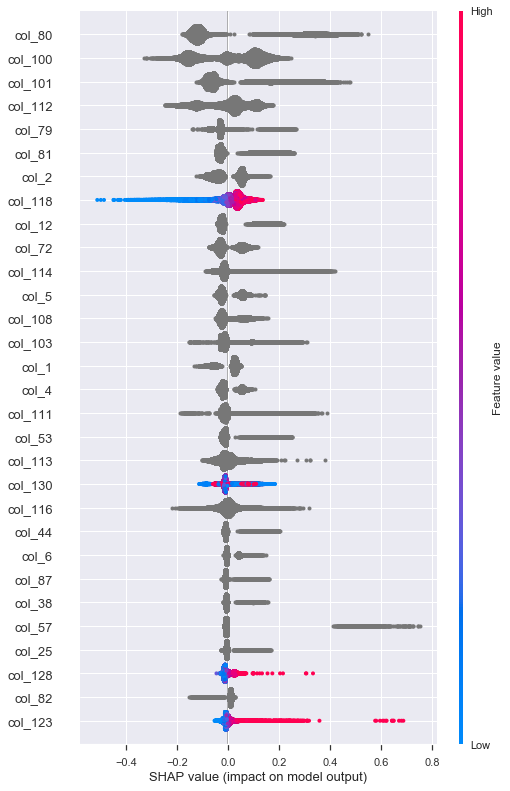

In [97]:
shap.summary_plot(shap_values, X_val[column], max_display=30)

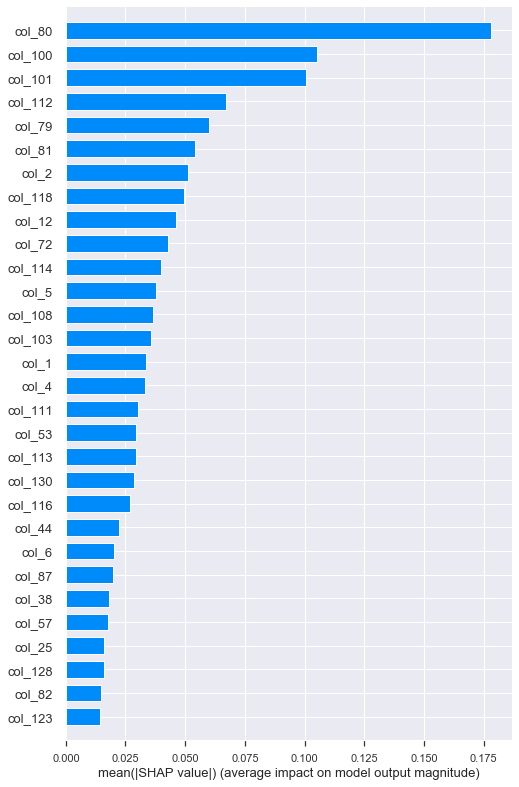

In [102]:
shap.summary_plot(shap_values, X_val[column], plot_type='bar', max_display=30)

# Predict

Не забудем проэкспонировать предикт))

In [98]:
pred_train = np.expm1(booster.predict(X_train[column]))
pred_val = np.expm1(booster.predict(X_val[column]))
pred_test = np.expm1(booster.predict(test_df[column]))

# Metrics

In [99]:
from sklearn import metrics

# Train

In [100]:
print(metrics.mean_absolute_error(y_train, pred_train))
print(metrics.mean_squared_error(y_train, pred_train))
print(metrics.mean_squared_log_error(y_train, pred_train))
print(metrics.median_absolute_error(y_train, pred_train))

2642.0588441358946
10922192.757531464
30.838913663807404
2003.9775513327754


# Val

In [101]:
print(metrics.mean_absolute_error(y_val, pred_val))
print(metrics.mean_squared_error(y_val, pred_val))
print(metrics.mean_squared_log_error(y_val, pred_val))
print(metrics.median_absolute_error(y_val, pred_val))

2661.480667109647
11204814.57527237
30.870952477550198
2011.7693229788867


# Тут нужно выделить с бизнесом бакеты и посчитать метрику понятную для бизнеса - % попадания бакет в бакет. Еще можно посчитать % попадание в 20% интервал.